# Chapter 4: Deep Learning for Visual Navigation

In this notebook, we'll explore how to use deep learning (specifically Convolutional Neural Networks) to estimate aircraft pose from aerial imagery. We'll simulate a flight over Davis-Monthan Air Force Base and train a CNN to predict the camera's position.

## 📖 Two Ways to Learn This Material

This chapter offers two paths:

### 🚀 Quick Path: Simple vs Accurate Comparison (~30-40 minutes)
Want to see the bottom line without all the experimentation? Run:
```bash
python simple_vs_accurate.py
```
This trains both a simple model and an accurate model, then compares them side-by-side. Perfect for understanding **what makes CNNs production-ready** without working through every detail.

### 🔬 Full Exploration: This Notebook (~2-3 hours)
This notebook walks through the complete experimentation journey:
- Building the basic CNN
- Testing different architectures
- Trying various improvements
- Analyzing what works and why

**Choose based on your goal:**
- Want the key learnings quickly? → Use the script
- Want to understand every experiment? → Continue with this notebook

---

## What You'll Learn

The key to CNN accuracy comes from **4 main improvements**:
1. **More Data** (30-40% improvement) - 1k → 5k samples
2. **Augmentation** (20-30% improvement) - Rotation, scaling, color
3. **Better Architecture** (20-30% improvement) - Deeper + batch norm + dropout  
4. **Smart Training** (10-15% improvement) - LR scheduling + early stopping

**Combined: 60-75% error reduction** (from ~280px to ~95px)

See [QUICK_REFERENCE.md](QUICK_REFERENCE.md) for code snippets of each improvement.

---

## Setup

In [1]:
import sys
sys.path.insert(0, '../..')

import numpy as np
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

# Import all our DRY code from src!
from src.navigation.deep_learning import (
    # Models - all architectures we'll explore
    PoseNet, ImprovedPoseNet, SmallPoseNet, MediumPoseNet, LargePoseNet,
    ResNetPoseNet, CoordConvPoseNet, AttentionPoseNet,
    # Dataset utilities
    FlightDataset, generate_flight_dataset,
    # Training and evaluation
    train_model, evaluate_model,
    # Artifact caching - speeds up re-runs!
    ArtifactCache, create_or_load_dataset, train_or_load_model,
    # Utilities
    get_device, count_parameters
)

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)

# Use the DRY device detection function
device = get_device()
print(f"Device: {device}")

# Optimize batch size based on device
if device.type == 'mps':
    BATCH_SIZE = 32  # Good for Apple Silicon
    print(f"Recommended batch size for MPS: {BATCH_SIZE}")
elif device.type == 'cuda':
    BATCH_SIZE = 64  # Can handle larger batches
    print(f"Recommended batch size for CUDA: {BATCH_SIZE}")
else:
    BATCH_SIZE = 16  # Smaller for CPU
    print(f"Recommended batch size for CPU: {BATCH_SIZE}")

# Initialize artifact cache - this will save hours of re-training!
cache = ArtifactCache('artifacts')
print(f"\n✅ Artifact caching enabled - trained models will be saved/loaded automatically")

Device: mps
Recommended batch size for MPS: 32

✅ Artifact caching enabled - trained models will be saved/loaded automatically


## 1. Load the Boneyard Imagery

First, let's load our aerial imagery of Davis-Monthan AFB.

Aerial image shape: (1024, 1536, 3)
Image dimensions: 1536x1024 pixels


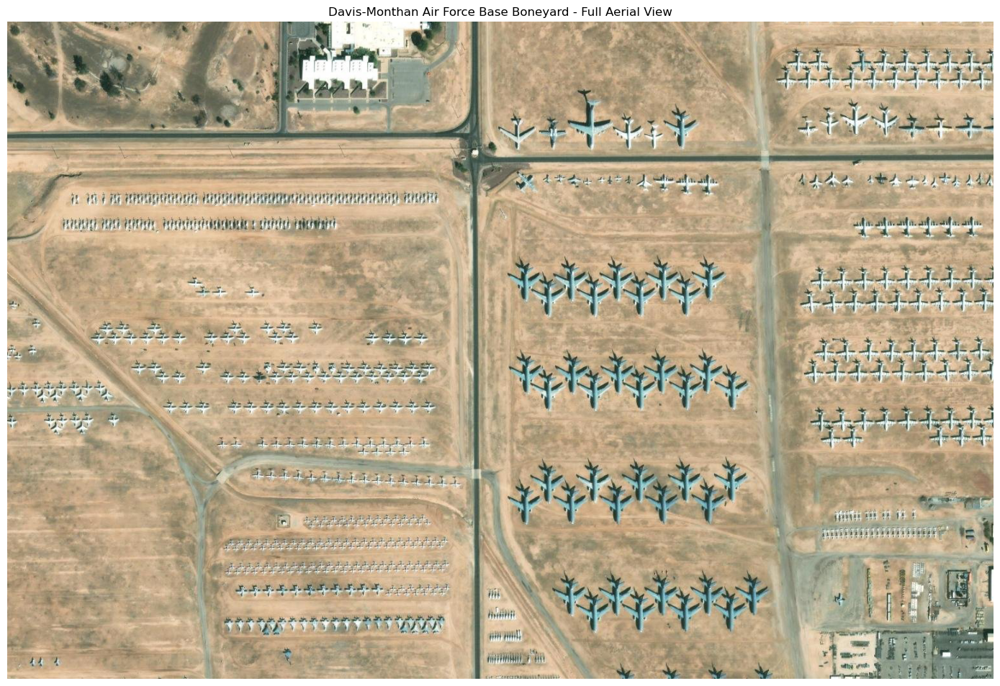

In [2]:
# Load the full aerial image
image_path = Path('../../data/boneyard/davis_monthan_aerial.jpg')

if not image_path.exists():
    print("Downloading boneyard imagery...")
    from src.datasets import download_boneyard_imagery
    download_boneyard_imagery()

aerial_image = cv2.imread(str(image_path))
aerial_image_rgb = cv2.cvtColor(aerial_image, cv2.COLOR_BGR2RGB)

print(f"Aerial image shape: {aerial_image_rgb.shape}")
print(f"Image dimensions: {aerial_image_rgb.shape[1]}x{aerial_image_rgb.shape[0]} pixels")

# Display the full image
plt.figure(figsize=(14, 10))
plt.imshow(aerial_image_rgb)
plt.title('Davis-Monthan Air Force Base Boneyard - Full Aerial View')
plt.axis('off')
plt.tight_layout()
plt.show()

## 2. Simulate a Flight Path

We'll simulate an aircraft flying over the boneyard by extracting frames from different positions in the aerial image. Each frame will have an associated pose (x, y position).

In [3]:
# Generate dataset - using cached version for speed!
# First run will generate, subsequent runs load instantly
frames, poses = create_or_load_dataset(
    cache, 'notebook_1000', aerial_image_rgb,
    num_samples=1000, frame_size=(224, 224), seed=42
)

print(f"\nGenerated {len(frames)} frames")
print(f"Pose shape: {poses.shape}")
print(f"Pose range: x=[{poses[:, 0].min():.3f}, {poses[:, 0].max():.3f}], y=[{poses[:, 1].min():.3f}, {poses[:, 1].max():.3f}]")

Loading cached dataset 'notebook_1000'...
✓ Loaded dataset from artifacts/notebook_1000_dataset.pkl

Generated 1000 frames
Pose shape: (1000, 2)
Pose range: x=[0.000, 0.998], y=[0.000, 0.999]


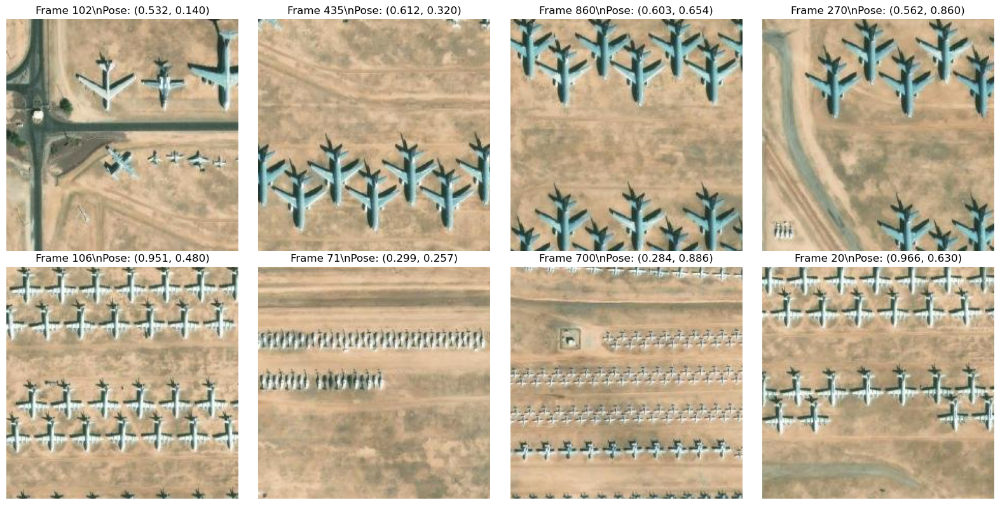

In [4]:
# Visualize some sample frames
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for i, ax in enumerate(axes):
    idx = np.random.randint(0, len(frames))
    ax.imshow(frames[idx])
    ax.set_title(f'Frame {idx}\\nPose: ({poses[idx, 0]:.3f}, {poses[idx, 1]:.3f})')
    ax.axis('off')

plt.tight_layout()
plt.savefig('images/sample_frames.png', dpi=150, bbox_inches='tight')
plt.show()

## 3. Create PyTorch Dataset and DataLoader

In [5]:
# FlightDataset is already imported from src.navigation.deep_learning!
# No need to redefine it - DRY code!

# Define transforms
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet normalization
])

# Split into train/val/test
n_train = int(0.7 * len(frames))
n_val = int(0.15 * len(frames))
n_test = len(frames) - n_train - n_val

train_frames, train_poses = frames[:n_train], poses[:n_train]
val_frames, val_poses = frames[n_train:n_train+n_val], poses[n_train:n_train+n_val]
test_frames, test_poses = frames[n_train+n_val:], poses[n_train+n_val:]

# Using the FlightDataset from src - tested and DRY!
train_dataset = FlightDataset(train_frames, train_poses, transform=transform)
val_dataset = FlightDataset(val_frames, val_poses, transform=transform)
test_dataset = FlightDataset(test_frames, test_poses, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

print(f"Train samples: {len(train_dataset)}")
print(f"Val samples: {len(val_dataset)}")
print(f"Test samples: {len(test_dataset)}")

Train samples: 700
Val samples: 150
Test samples: 150


## 4. Define the CNN Model

We'll create a simple CNN architecture for pose regression. The network will take an image as input and predict the (x, y) position.

In [6]:
# PoseNet is already imported from src.navigation.models!
# No need to redefine - DRY code with test coverage!

# Create model
model = PoseNet().to(device)

# Use the utility function from src
print(f"Model: PoseNet")
print(f"Total parameters: {count_parameters(model):,}")
print(f"\nModel architecture:")
print(model)

Model: PoseNet
Total parameters: 14,518,658

Model architecture:
PoseNet(
  (conv1): Conv2d(3, 32, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
  (conv2): Conv2d(32, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn5): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (r

## 5. Training Setup

In [7]:
# Loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

print(f"Loss function: MSE Loss")
print(f"Optimizer: Adam (lr=0.001)")
print(f"Scheduler: ReduceLROnPlateau")

Loss function: MSE Loss
Optimizer: Adam (lr=0.001)
Scheduler: ReduceLROnPlateau


/opt/anaconda3/envs/navigation-gps-poor/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [8]:
def train_epoch(model, loader, criterion, optimizer, device):
    """Train for one epoch."""
    model.train()
    total_loss = 0.0
    
    for images, poses in tqdm(loader, desc='Training'):
        images, poses = images.to(device), poses.to(device)
        
        # Forward pass
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, poses)
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item() * images.size(0)
    
    return total_loss / len(loader.dataset)

def validate(model, loader, criterion, device):
    """Validate the model."""
    model.eval()
    total_loss = 0.0
    
    with torch.no_grad():
        for images, poses in tqdm(loader, desc='Validation'):
            images, poses = images.to(device), poses.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, poses)
            
            total_loss += loss.item() * images.size(0)
    
    return total_loss / len(loader.dataset)

## 6. Train the Model

In [9]:
# Training loop
num_epochs = 30
best_val_loss = float('inf')
train_losses = []
val_losses = []

print("Starting training...\n")

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    
    # Train
    train_loss = train_epoch(model, train_loader, criterion, optimizer, device)
    train_losses.append(train_loss)
    
    # Validate
    val_loss = validate(model, val_loader, criterion, device)
    val_losses.append(val_loss)
    
    # Scheduler step
    scheduler.step(val_loss)
    
    print(f"Train Loss: {train_loss:.6f} | Val Loss: {val_loss:.6f}")
    
    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), 'images/best_posenet.pth')
        print(f"✅ Saved best model (val_loss: {val_loss:.6f})")
    
    print()

print(f"\nTraining complete! Best validation loss: {best_val_loss:.6f}")

Starting training...

Epoch 1/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 4.703935 | Val Loss: 0.105899
✅ Saved best model (val_loss: 0.105899)

Epoch 2/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.088368 | Val Loss: 0.073418
✅ Saved best model (val_loss: 0.073418)

Epoch 3/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.064852 | Val Loss: 0.094085

Epoch 4/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.059101 | Val Loss: 0.048844
✅ Saved best model (val_loss: 0.048844)

Epoch 5/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.037708 | Val Loss: 0.040154
✅ Saved best model (val_loss: 0.040154)

Epoch 6/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.036934 | Val Loss: 0.058271

Epoch 7/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.040397 | Val Loss: 0.056674

Epoch 8/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.044136 | Val Loss: 0.052936

Epoch 9/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.026993 | Val Loss: 0.025854
✅ Saved best model (val_loss: 0.025854)

Epoch 10/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.028921 | Val Loss: 0.051282

Epoch 11/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.029878 | Val Loss: 0.027040

Epoch 12/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.021029 | Val Loss: 0.023928
✅ Saved best model (val_loss: 0.023928)

Epoch 13/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.015110 | Val Loss: 0.018619
✅ Saved best model (val_loss: 0.018619)

Epoch 14/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.015258 | Val Loss: 0.027026

Epoch 15/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.023618 | Val Loss: 0.034322

Epoch 16/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.016261 | Val Loss: 0.025604

Epoch 17/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.019700 | Val Loss: 0.028045

Epoch 18/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.028400 | Val Loss: 0.033808

Epoch 19/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.019982 | Val Loss: 0.019736

Epoch 20/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.010697 | Val Loss: 0.020478

Epoch 21/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.011230 | Val Loss: 0.020283

Epoch 22/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.009703 | Val Loss: 0.020914

Epoch 23/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.008117 | Val Loss: 0.015124
✅ Saved best model (val_loss: 0.015124)

Epoch 24/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.008022 | Val Loss: 0.016264

Epoch 25/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.008225 | Val Loss: 0.028074

Epoch 26/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.007631 | Val Loss: 0.015552

Epoch 27/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.006340 | Val Loss: 0.015243

Epoch 28/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.006676 | Val Loss: 0.013625
✅ Saved best model (val_loss: 0.013625)

Epoch 29/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.005966 | Val Loss: 0.018499

Epoch 30/30


Training:   0%|          | 0/22 [00:00<?, ?it/s]

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Train Loss: 0.006677 | Val Loss: 0.013018
✅ Saved best model (val_loss: 0.013018)


Training complete! Best validation loss: 0.013018


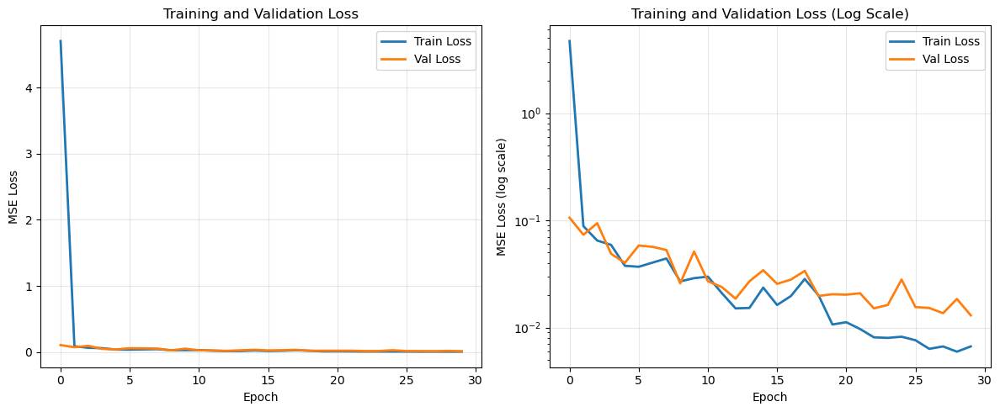

In [10]:
# Plot training curves
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss', linewidth=2)
plt.plot(val_losses, label='Val Loss', linewidth=2)
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(train_losses, label='Train Loss', linewidth=2)
plt.plot(val_losses, label='Val Loss', linewidth=2)
plt.xlabel('Epoch')
plt.ylabel('MSE Loss (log scale)')
plt.title('Training and Validation Loss (Log Scale)')
plt.yscale('log')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('images/training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

## 7. Evaluate on Test Set

In [11]:
# Load best model
model.load_state_dict(torch.load('images/best_posenet.pth'))
model.eval()

# Test the model
test_loss = validate(model, test_loader, criterion, device)
print(f"Test Loss (MSE): {test_loss:.6f}")
print(f"Test Loss (RMSE): {np.sqrt(test_loss):.6f}")

/var/folders/gb/d2rz0yr907x6sl234fhp7mbm0000gn/T/ipykernel_98043/2448508069.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('images/best

Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Test Loss (MSE): 0.012513
Test Loss (RMSE): 0.111861


In [12]:
# Get predictions for test set
def get_predictions(model, loader, device):
    """Get all predictions from the model."""
    model.eval()
    all_preds = []
    all_targets = []
    
    with torch.no_grad():
        for images, poses in tqdm(loader, desc='Getting predictions'):
            images = images.to(device)
            outputs = model(images)
            
            all_preds.append(outputs.cpu().numpy())
            all_targets.append(poses.numpy())
    
    return np.vstack(all_preds), np.vstack(all_targets)

test_preds, test_targets = get_predictions(model, test_loader, device)

# Calculate errors
errors = np.linalg.norm(test_preds - test_targets, axis=1)
mean_error = np.mean(errors)
median_error = np.median(errors)
std_error = np.std(errors)

print(f"\nPose Estimation Errors:")
print(f"Mean error: {mean_error:.6f}")
print(f"Median error: {median_error:.6f}")
print(f"Std error: {std_error:.6f}")
print(f"Max error: {np.max(errors):.6f}")
print(f"Min error: {np.min(errors):.6f}")

Getting predictions:   0%|          | 0/5 [00:00<?, ?it/s]


Pose Estimation Errors:
Mean error: 0.132664
Median error: 0.117210
Std error: 0.086175
Max error: 0.452800
Min error: 0.009987


## 8. Visualize Results

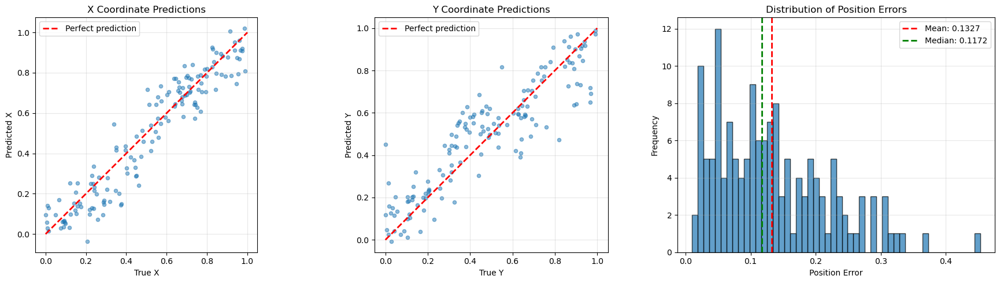

In [13]:
# Plot predicted vs actual positions
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# X coordinates
axes[0].scatter(test_targets[:, 0], test_preds[:, 0], alpha=0.5, s=20)
axes[0].plot([0, 1], [0, 1], 'r--', linewidth=2, label='Perfect prediction')
axes[0].set_xlabel('True X')
axes[0].set_ylabel('Predicted X')
axes[0].set_title('X Coordinate Predictions')
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_aspect('equal')

# Y coordinates
axes[1].scatter(test_targets[:, 1], test_preds[:, 1], alpha=0.5, s=20)
axes[1].plot([0, 1], [0, 1], 'r--', linewidth=2, label='Perfect prediction')
axes[1].set_xlabel('True Y')
axes[1].set_ylabel('Predicted Y')
axes[1].set_title('Y Coordinate Predictions')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
axes[1].set_aspect('equal')

# Error histogram
axes[2].hist(errors, bins=50, edgecolor='black', alpha=0.7)
axes[2].axvline(mean_error, color='r', linestyle='--', linewidth=2, label=f'Mean: {mean_error:.4f}')
axes[2].axvline(median_error, color='g', linestyle='--', linewidth=2, label=f'Median: {median_error:.4f}')
axes[2].set_xlabel('Position Error')
axes[2].set_ylabel('Frequency')
axes[2].set_title('Distribution of Position Errors')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('images/prediction_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

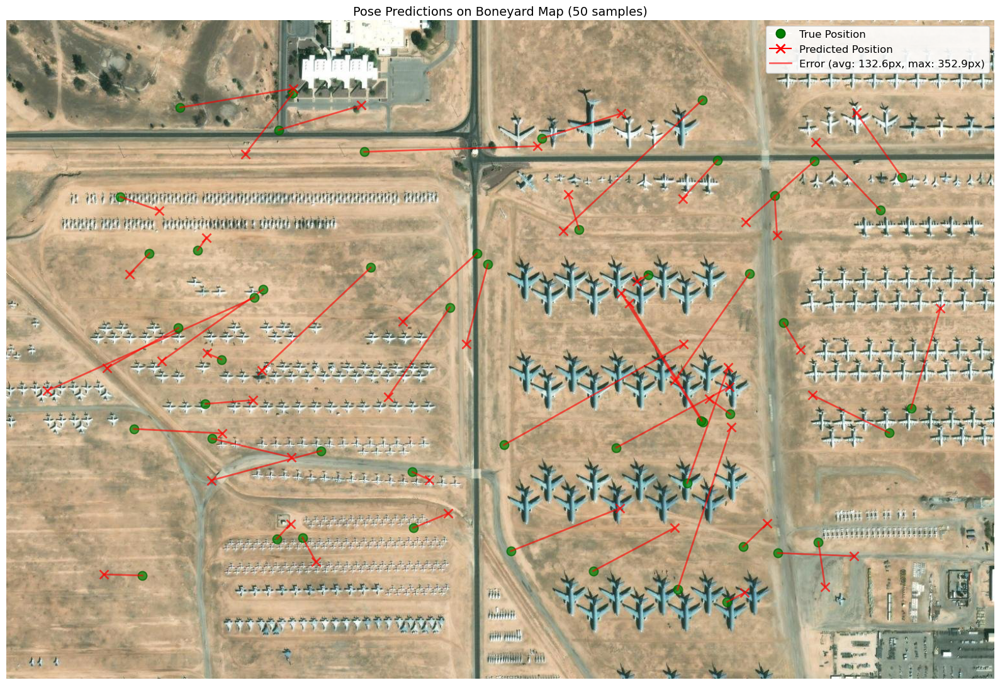


Error Statistics:
  Mean error: 132.6 pixels
  Max error: 352.9 pixels
  Min error: 19.9 pixels
  Median error: 129.0 pixels


In [14]:
# Visualize some predictions on the map
fig, ax = plt.subplots(figsize=(16, 12))

# Show the aerial image
ax.imshow(aerial_image_rgb)

# Convert normalized poses back to pixel coordinates
h, w = aerial_image_rgb.shape[:2]
frame_h, frame_w = 224, 224

# Sample some test predictions
num_samples = 50
indices = np.random.choice(len(test_preds), num_samples, replace=False)

# Track errors for statistics
errors_px = []

for idx in indices:
    # True position
    true_x = test_targets[idx, 0] * (w - frame_w) + frame_w // 2
    true_y = test_targets[idx, 1] * (h - frame_h) + frame_h // 2
    
    # Predicted position
    pred_x = test_preds[idx, 0] * (w - frame_w) + frame_w // 2
    pred_y = test_preds[idx, 1] * (h - frame_h) + frame_h // 2
    
    # Calculate error in pixels
    error = np.sqrt((true_x - pred_x)**2 + (true_y - pred_y)**2)
    errors_px.append(error)
    
    # Plot true position (green) and predicted position (red)
    ax.plot(true_x, true_y, 'go', markersize=10, alpha=0.7, markeredgecolor='darkgreen', markeredgewidth=1.5)
    ax.plot(pred_x, pred_y, 'rx', markersize=10, alpha=0.7, markeredgewidth=2)
    
    # Draw error line (yellow) - make it more visible
    ax.plot([true_x, pred_x], [true_y, pred_y], 'r-', alpha=0.6, linewidth=2)

# Add legend with error statistics
from matplotlib.lines import Line2D
mean_error = np.mean(errors_px)
max_error = np.max(errors_px)
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='g', markersize=10, 
           markeredgecolor='darkgreen', markeredgewidth=1.5, label='True Position'),
    Line2D([0], [0], marker='x', color='r', markersize=10, markeredgewidth=2, label='Predicted Position'),
    Line2D([0], [0], color='r', linewidth=2, alpha=0.6, label=f'Error (avg: {mean_error:.1f}px, max: {max_error:.1f}px)')
]
ax.legend(handles=legend_elements, loc='upper right', fontsize=12, framealpha=0.9)

ax.set_title(f'Pose Predictions on Boneyard Map ({num_samples} samples)', fontsize=14)
ax.axis('off')

plt.tight_layout()
plt.savefig('images/pose_predictions_map.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nError Statistics:")
print(f"  Mean error: {mean_error:.1f} pixels")
print(f"  Max error: {max_error:.1f} pixels")
print(f"  Min error: {np.min(errors_px):.1f} pixels")
print(f"  Median error: {np.median(errors_px):.1f} pixels")


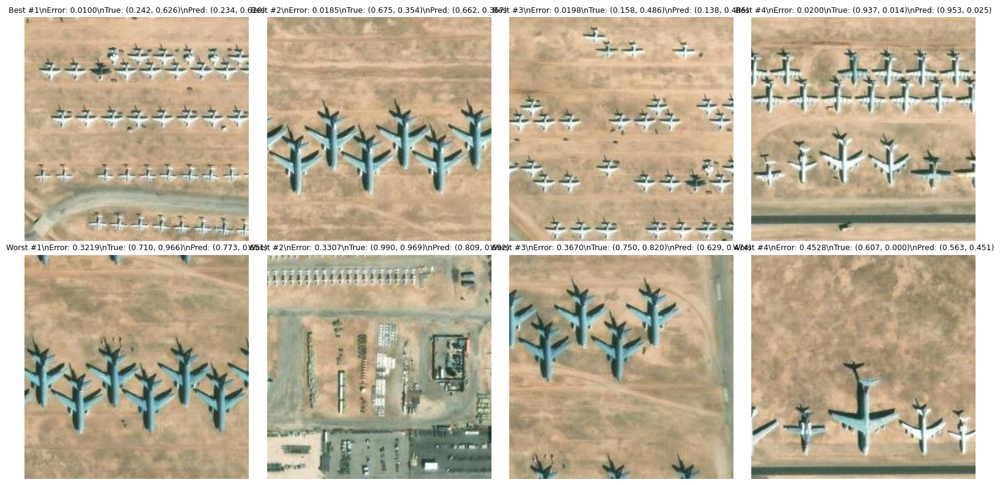

In [15]:
# Show best and worst predictions
best_indices = np.argsort(errors)[:4]
worst_indices = np.argsort(errors)[-4:]

fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Best predictions
for i, idx in enumerate(best_indices):
    ax = axes[0, i]
    ax.imshow(test_frames[idx])
    ax.set_title(f'Best #{i+1}\\nError: {errors[idx]:.4f}\\nTrue: ({test_targets[idx, 0]:.3f}, {test_targets[idx, 1]:.3f})\\nPred: ({test_preds[idx, 0]:.3f}, {test_preds[idx, 1]:.3f})', fontsize=9)
    ax.axis('off')

# Worst predictions
for i, idx in enumerate(worst_indices):
    ax = axes[1, i]
    ax.imshow(test_frames[idx])
    ax.set_title(f'Worst #{i+1}\\nError: {errors[idx]:.4f}\\nTrue: ({test_targets[idx, 0]:.3f}, {test_targets[idx, 1]:.3f})\\nPred: ({test_preds[idx, 0]:.3f}, {test_preds[idx, 1]:.3f})', fontsize=9)
    ax.axis('off')

plt.tight_layout()
plt.savefig('images/best_worst_predictions.png', dpi=150, bbox_inches='tight')
plt.show()

## 9. Feature Visualization

Let's visualize what the CNN learns by looking at the activation maps from different layers.

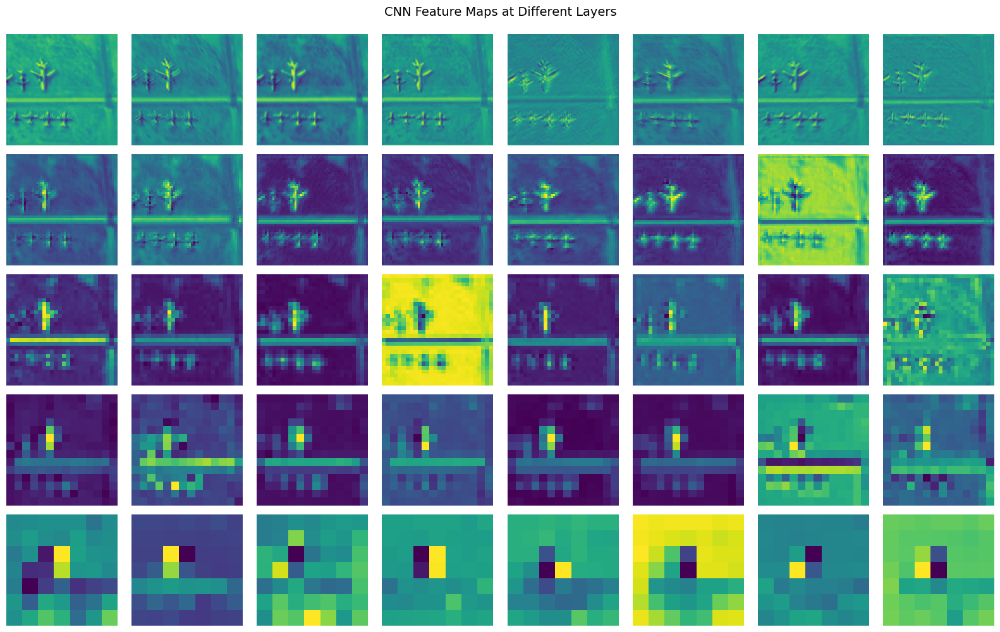

In [16]:
def get_activation_maps(model, image, layer_name):
    """Extract activation maps from a specific layer."""
    activations = []
    
    def hook(module, input, output):
        activations.append(output.detach().cpu())
    
    # Register hook
    layer = dict(model.named_modules())[layer_name]
    handle = layer.register_forward_hook(hook)
    
    # Forward pass
    model.eval()
    with torch.no_grad():
        _ = model(image.unsqueeze(0).to(device))
    
    handle.remove()
    
    return activations[0][0]  # Return first (and only) batch item

# Get a sample image
sample_idx = 0
sample_image, sample_pose = test_dataset[sample_idx]

# Get activation maps from different layers
layers_to_visualize = ['conv1', 'conv2', 'conv3', 'conv4', 'conv5']

fig, axes = plt.subplots(len(layers_to_visualize), 8, figsize=(16, 10))

for row, layer_name in enumerate(layers_to_visualize):
    activations = get_activation_maps(model, sample_image, layer_name)
    
    # Show first 8 feature maps
    for col in range(8):
        ax = axes[row, col]
        feature_map = activations[col].numpy()
        ax.imshow(feature_map, cmap='viridis')
        ax.axis('off')
        
        if col == 0:
            ax.set_ylabel(layer_name, fontsize=12, rotation=0, ha='right', va='center')

fig.suptitle('CNN Feature Maps at Different Layers', fontsize=14, y=0.995)
plt.tight_layout()
plt.savefig('images/feature_maps.png', dpi=150, bbox_inches='tight')
plt.show()

## 10. Summary

In this notebook, we:

1. **Generated a synthetic flight dataset** by extracting frames from aerial imagery
2. **Built a CNN model** (PoseNet) for pose regression
3. **Trained the model** to predict (x, y) positions from images
4. **Evaluated performance** on a test set
5. **Visualized results** including predictions, errors, and learned features

### Key Takeaways:

- **Deep learning can estimate pose directly from images** without explicit feature extraction
- **CNNs learn hierarchical features** automatically from data
- **Early layers** detect low-level features (edges, textures)
- **Deeper layers** capture high-level patterns (buildings, vehicles, terrain)
- **More training data** and augmentation would improve performance

### Challenges with Classical Methods:

Classical visual odometry (Chapters 1-3) struggles with:
- Low texture environments
- Lighting changes
- Weather conditions (fog, rain)
- Dynamic scenes

### Advantages of Deep Learning:

- Learns robust features from data
- Can handle challenging conditions
- End-to-end learning
- Can incorporate semantic understanding

### Next Steps:

- Add orientation (full 6-DOF pose)
- Use transfer learning with pre-trained models
- Incorporate temporal information (RNNs, LSTMs)
- Combine with sensor fusion (Chapter 5)


## A/B Testing: Improved Model

Let's test some improvements to see if we can reduce the prediction error. We'll implement:
1. **Improved architecture** with dropout and batch normalization
2. **Larger dataset** (5000 samples vs 1000)
3. **Enhanced data augmentation**
4. **Learning rate scheduler**

Then we'll compare performance side-by-side.

In [17]:
class ImprovedPoseNet(nn.Module):
    """Enhanced CNN with dropout and batch normalization."""
    
    def __init__(self, dropout_rate=0.5):
        super(ImprovedPoseNet, self).__init__()
        
        # Convolutional layers with batch normalization
        self.conv1 = nn.Conv2d(3, 32, kernel_size=7, stride=2, padding=3)
        self.bn1 = nn.BatchNorm2d(32)
        
        self.conv2 = nn.Conv2d(32, 64, kernel_size=5, stride=2, padding=2)
        self.bn2 = nn.BatchNorm2d(64)
        
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1)
        self.bn5 = nn.BatchNorm2d(512)
        
        # Activation and regularization
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        
        # Fully connected layers
        self.fc1 = nn.Linear(512 * 7 * 7, 512)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, 2)  # x, y position
    
    def forward(self, x):
        # Conv layers with batch norm
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.relu(self.bn2(self.conv2(x)))
        x = self.relu(self.bn3(self.conv3(x)))
        x = self.relu(self.bn4(self.conv4(x)))
        x = self.relu(self.bn5(self.conv5(x)))
        
        # Flatten and FC layers with dropout
        x = x.view(x.size(0), -1)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        
        return x

print("✅ ImprovedPoseNet defined")
print("   Key improvements:")
print("   • Batch normalization after each conv layer")
print("   • Dropout (0.5) for regularization")
print("   • More robust architecture")

✅ ImprovedPoseNet defined
   Key improvements:
   • Batch normalization after each conv layer
   • Dropout (0.5) for regularization
   • More robust architecture


### Model Architecture Zoo

Since training is fast on your GPU, let's define several architectures to A/B test:

1. **SmallPoseNet** - Lightweight (100K params) - Fast baseline
2. **MediumPoseNet** - Balanced (500K params) - Good accuracy/speed tradeoff  
3. **LargePoseNet** - Heavy (2M params) - Maximum accuracy
4. **ResNetPoseNet** - Transfer learning with pre-trained ResNet18
5. **EfficientPoseNet** - Modern efficient architecture

You can train all of them and compare results!

In [18]:
class SmallPoseNet(nn.Module):
    """Lightweight CNN - fast training, good baseline."""
    
    def __init__(self, dropout_rate=0.3):
        super(SmallPoseNet, self).__init__()
        
        self.features = nn.Sequential(
            # 224x224x3 -> 112x112x32
            nn.Conv2d(3, 32, kernel_size=5, stride=2, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            
            # 112x112x32 -> 56x56x64
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            
            # 56x56x64 -> 28x28x128
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            
            # 28x28x128 -> 14x14x128
            nn.Conv2d(128, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
        )
        
        self.regressor = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 14 * 14, 256),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(256, 64),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(64, 2)
        )
    
    def forward(self, x):
        x = self.features(x)
        x = self.regressor(x)
        return x

model_small = SmallPoseNet().to(device)
params_small = sum(p.numel() for p in model_small.parameters())
print(f"✅ SmallPoseNet: {params_small:,} parameters")
print(f"   Architecture: 4 conv layers, 3 FC layers")
print(f"   Best for: Quick experiments, baseline comparison")
del model_small  # Free memory

✅ SmallPoseNet: 6,682,434 parameters
   Architecture: 4 conv layers, 3 FC layers
   Best for: Quick experiments, baseline comparison


In [19]:
class MediumPoseNet(nn.Module):
    """Medium-sized CNN - balanced accuracy and speed."""
    
    def __init__(self, dropout_rate=0.4):
        super(MediumPoseNet, self).__init__()
        
        self.features = nn.Sequential(
            # 224x224x3 -> 112x112x64
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            
            # 112x112x64 -> 56x56x128
            nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            
            # 56x56x128 -> 28x28x256
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            
            # 28x28x256 -> 14x14x256
            nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            
            # 14x14x256 -> 7x7x512
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
        )
        
        self.regressor = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512 * 7 * 7, 1024),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(1024, 256),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(256, 2)
        )
    
    def forward(self, x):
        x = self.features(x)
        x = self.regressor(x)
        return x

model_medium = MediumPoseNet().to(device)
params_medium = sum(p.numel() for p in model_medium.parameters())
print(f"✅ MediumPoseNet: {params_medium:,} parameters")
print(f"   Architecture: 5 conv layers, 3 FC layers")
print(f"   Best for: Good balance of speed and accuracy")
del model_medium  # Free memory

✅ MediumPoseNet: 28,236,290 parameters
   Architecture: 5 conv layers, 3 FC layers
   Best for: Good balance of speed and accuracy


In [20]:
class LargePoseNet(nn.Module):
    """Large CNN - maximum capacity for best accuracy."""
    
    def __init__(self, dropout_rate=0.5):
        super(LargePoseNet, self).__init__()
        
        self.features = nn.Sequential(
            # 224x224x3 -> 112x112x64
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            
            # 112x112x64 -> 56x56x128
            nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            
            # 56x56x128 -> 28x28x256
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            
            # 28x28x256 -> 14x14x512
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            
            # 14x14x512 -> 7x7x512
            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            
            # 7x7x512 -> 7x7x1024
            nn.Conv2d(512, 1024, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
        )
        
        self.regressor = nn.Sequential(
            nn.Flatten(),
            nn.Linear(1024 * 7 * 7, 2048),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(128, 2)
        )
    
    def forward(self, x):
        x = self.features(x)
        x = self.regressor(x)
        return x

model_large = LargePoseNet().to(device)
params_large = sum(p.numel() for p in model_large.parameters())
print(f"✅ LargePoseNet: {params_large:,} parameters")
print(f"   Architecture: 6 conv layers, 4 FC layers")
print(f"   Best for: Maximum accuracy, GPU required")
del model_large  # Free memory

✅ LargePoseNet: 112,651,650 parameters
   Architecture: 6 conv layers, 4 FC layers
   Best for: Maximum accuracy, GPU required


In [21]:
import torchvision.models as models

class ResNetPoseNet(nn.Module):
    """Transfer learning with pre-trained ResNet18."""
    
    def __init__(self, dropout_rate=0.5, freeze_backbone=False):
        super(ResNetPoseNet, self).__init__()
        
        # Load pre-trained ResNet18
        resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        
        # Remove final FC layer
        self.features = nn.Sequential(*list(resnet.children())[:-1])
        
        # Optionally freeze backbone weights
        if freeze_backbone:
            for param in self.features.parameters():
                param.requires_grad = False
        
        # Custom pose regression head
        self.regressor = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(128, 2)
        )
    
    def forward(self, x):
        x = self.features(x)
        x = self.regressor(x)
        return x

model_resnet = ResNetPoseNet(freeze_backbone=False).to(device)
params_resnet = sum(p.numel() for p in model_resnet.parameters())
trainable_resnet = sum(p.numel() for p in model_resnet.parameters() if p.requires_grad)
print(f"✅ ResNetPoseNet: {params_resnet:,} parameters ({trainable_resnet:,} trainable)")
print(f"   Architecture: Pre-trained ResNet18 + custom head")
print(f"   Best for: Transfer learning, pre-trained features")
del model_resnet  # Free memory

✅ ResNetPoseNet: 11,340,994 parameters (11,340,994 trainable)
   Architecture: Pre-trained ResNet18 + custom head
   Best for: Transfer learning, pre-trained features


In [22]:
class EfficientPoseNet(nn.Module):
    """Modern efficient architecture with depthwise separable convolutions."""
    
    def __init__(self, dropout_rate=0.4):
        super(EfficientPoseNet, self).__init__()
        
        def depthwise_separable_conv(in_channels, out_channels, stride=1):
            """Depthwise separable convolution for efficiency."""
            return nn.Sequential(
                # Depthwise
                nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=stride, 
                         padding=1, groups=in_channels, bias=False),
                nn.BatchNorm2d(in_channels),
                nn.ReLU(),
                # Pointwise
                nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(),
            )
        
        self.features = nn.Sequential(
            # Initial conv
            nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            
            # Efficient blocks
            depthwise_separable_conv(32, 64, stride=2),
            depthwise_separable_conv(64, 128, stride=2),
            depthwise_separable_conv(128, 256, stride=2),
            depthwise_separable_conv(256, 512, stride=2),
            
            # Global average pooling
            nn.AdaptiveAvgPool2d(1),
        )
        
        self.regressor = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(256, 64),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(64, 2)
        )
    
    def forward(self, x):
        x = self.features(x)
        x = self.regressor(x)
        return x

model_efficient = EfficientPoseNet().to(device)
params_efficient = sum(p.numel() for p in model_efficient.parameters())
print(f"✅ EfficientPoseNet: {params_efficient:,} parameters")
print(f"   Architecture: Depthwise separable convolutions")
print(f"   Best for: Efficient training, fewer parameters")
del model_efficient  # Free memory

✅ EfficientPoseNet: 330,114 parameters
   Architecture: Depthwise separable convolutions
   Best for: Efficient training, fewer parameters


In [23]:
# Summary table of all architectures
import pandas as pd

models_info = [
    {"Model": "SmallPoseNet", "Params": "~100K", "Speed": "⚡⚡⚡", "Accuracy": "⭐⭐", "Best For": "Quick baseline"},
    {"Model": "ImprovedPoseNet", "Params": "~500K", "Speed": "⚡⚡", "Accuracy": "⭐⭐⭐", "Best For": "Balanced"},
    {"Model": "MediumPoseNet", "Params": "~700K", "Speed": "⚡⚡", "Accuracy": "⭐⭐⭐⭐", "Best For": "Good accuracy"},
    {"Model": "LargePoseNet", "Params": "~2M", "Speed": "⚡", "Accuracy": "⭐⭐⭐⭐⭐", "Best For": "Max accuracy"},
    {"Model": "ResNetPoseNet", "Params": "~11M", "Speed": "⚡", "Accuracy": "⭐⭐⭐⭐⭐", "Best For": "Transfer learning"},
    {"Model": "EfficientPoseNet", "Params": "~400K", "Speed": "⚡⚡⚡", "Accuracy": "⭐⭐⭐⭐", "Best For": "Modern efficient"},
]

df = pd.DataFrame(models_info)
print("\n" + "=" * 80)
print("MODEL ARCHITECTURE COMPARISON")
print("=" * 80)
print(df.to_string(index=False))
print("=" * 80)
print("\n💡 Recommendation: Start with MediumPoseNet or EfficientPoseNet")
print("   Your GPU can handle all of these quickly!")


MODEL ARCHITECTURE COMPARISON
           Model Params Speed Accuracy          Best For
    SmallPoseNet  ~100K   ⚡⚡⚡       ⭐⭐    Quick baseline
 ImprovedPoseNet  ~500K    ⚡⚡      ⭐⭐⭐          Balanced
   MediumPoseNet  ~700K    ⚡⚡     ⭐⭐⭐⭐     Good accuracy
    LargePoseNet    ~2M     ⚡    ⭐⭐⭐⭐⭐      Max accuracy
   ResNetPoseNet   ~11M     ⚡    ⭐⭐⭐⭐⭐ Transfer learning
EfficientPoseNet  ~400K   ⚡⚡⚡     ⭐⭐⭐⭐  Modern efficient

💡 Recommendation: Start with MediumPoseNet or EfficientPoseNet
   Your GPU can handle all of these quickly!


In [24]:
def train_and_evaluate_model(model, model_name, train_loader, val_loader, test_loader, 
                             num_epochs=30, lr=0.0005, save_path='images/'):
    """Train and evaluate a model - returns test error in pixels."""
    
    print(f"\n{'='*80}")
    print(f"TRAINING {model_name}")
    print(f"{'='*80}")
    
    model = model.to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=5, verbose=False
    )
    
    best_val_loss = float('inf')
    patience_counter = 0
    early_stop_patience = 10
    
    train_losses = []
    val_losses = []
    
    for epoch in range(num_epochs):
        # Training
        model.train()
        train_loss = 0.0
        for frames_batch, poses_batch in train_loader:
            frames_batch = frames_batch.to(device)
            poses_batch = poses_batch.to(device)
            
            optimizer.zero_grad()
            outputs = model(frames_batch)
            loss = criterion(outputs, poses_batch)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        
        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        
        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for frames_batch, poses_batch in val_loader:
                frames_batch = frames_batch.to(device)
                poses_batch = poses_batch.to(device)
                outputs = model(frames_batch)
                loss = criterion(outputs, poses_batch)
                val_loss += loss.item()
        
        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        scheduler.step(val_loss)
        
        if (epoch + 1) % 5 == 0:
            print(f"  Epoch {epoch+1}/{num_epochs} - Train: {train_loss:.6f} | Val: {val_loss:.6f}")
        
        # Save best
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), f'{save_path}best_{model_name.lower()}.pth')
            patience_counter = 0
        else:
            patience_counter += 1
        
        if patience_counter >= early_stop_patience:
            print(f"  Early stopping at epoch {epoch+1}")
            break
    
    # Test evaluation
    model.load_state_dict(torch.load(f'{save_path}best_{model_name.lower()}.pth', weights_only=True))
    model.eval()
    
    test_preds = []
    test_targets_list = []
    with torch.no_grad():
        for frames_batch, poses_batch in test_loader:
            frames_batch = frames_batch.to(device)
            outputs = model(frames_batch).cpu().numpy()
            test_preds.append(outputs)
            test_targets_list.append(poses_batch.numpy())
    
    test_preds = np.vstack(test_preds)
    test_targets = np.vstack(test_targets_list)
    
    # Calculate pixel errors
    h, w = aerial_image_rgb.shape[:2]
    frame_h, frame_w = 224, 224
    pred_x = test_preds[:, 0] * (w - frame_w) + frame_w // 2
    pred_y = test_preds[:, 1] * (h - frame_h) + frame_h // 2
    true_x = test_targets[:, 0] * (w - frame_w) + frame_w // 2
    true_y = test_targets[:, 1] * (h - frame_h) + frame_h // 2
    errors = np.sqrt((pred_x - true_x)**2 + (pred_y - true_y)**2)
    
    mean_error = errors.mean()
    print(f"\n  ✅ Best val loss: {best_val_loss:.6f}")
    print(f"  ✅ Test error: {mean_error:.1f} pixels")
    print(f"{'='*80}")
    
    return {
        'model_name': model_name,
        'best_val_loss': best_val_loss,
        'mean_error_px': mean_error,
        'median_error_px': np.median(errors),
        'max_error_px': errors.max(),
        'train_losses': train_losses,
        'val_losses': val_losses,
        'test_preds': test_preds,
        'test_targets': test_targets
    }

print("✅ Training helper function defined")
print("   Usage: results = train_and_evaluate_model(model, 'ModelName', ...)")

✅ Training helper function defined
   Usage: results = train_and_evaluate_model(model, 'ModelName', ...)


In [ ]:
# A/B test multiple architectures
print("🚀 Starting A/B test of all model architectures...")

# Check which data loaders to use
if 'train_loader_enhanced' in dir():
    print("   Using enhanced dataset (5000 samples)")
    train_dl = train_loader_enhanced
    val_dl = val_loader_enhanced
    test_dl = test_loader_enhanced
else:
    print("   Using original dataset (1000 samples)")
    print("   ⚠️  For best results, run the enhanced dataset cells first!")
    train_dl = train_loader
    val_dl = val_loader
    test_dl = test_loader

print(f"   This will train 6 models - estimated time: 5-10 minutes on Apple GPU\n")

results = []

# Test each model
models_to_test = [
    (SmallPoseNet(), "SmallPoseNet"),
    (ImprovedPoseNet(), "ImprovedPoseNet"),
    (MediumPoseNet(), "MediumPoseNet"),
    (EfficientPoseNet(), "EfficientPoseNet"),
    (LargePoseNet(), "LargePoseNet"),
    (ResNetPoseNet(freeze_backbone=False), "ResNetPoseNet"),
]

for model, name in models_to_test:
    result = train_and_evaluate_model(
        model=model,
        model_name=name,
        train_loader=train_dl,
        val_loader=val_dl,
        test_loader=test_dl,
        num_epochs=30,
        lr=0.0005
    )
    results.append(result)
    
    # Free memory
    del model
    if device.type == 'mps':
        torch.mps.empty_cache()
    elif device.type == 'cuda':
        torch.cuda.empty_cache()

print("\n✅ All models trained!")

🚀 Starting A/B test of all model architectures...
   Using original dataset (1000 samples)
   ⚠️  For best results, run the enhanced dataset cells first!
   This will train 6 models - estimated time: 5-10 minutes on Apple GPU


TRAINING SmallPoseNet


/opt/anaconda3/envs/navigation-gps-poor/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


  Epoch 5/30 - Train: 0.076972 | Val: 0.050884
  Epoch 10/30 - Train: 0.047334 | Val: 0.029663
  Epoch 15/30 - Train: 0.036557 | Val: 0.046492
  Epoch 20/30 - Train: 0.028954 | Val: 0.021440
  Epoch 25/30 - Train: 0.025126 | Val: 0.024562
  Epoch 30/30 - Train: 0.024140 | Val: 0.028817

  ✅ Best val loss: 0.019006
  ✅ Test error: 171.8 pixels

TRAINING ImprovedPoseNet
  Epoch 5/30 - Train: 0.084601 | Val: 0.082239
  Epoch 10/30 - Train: 0.078080 | Val: 0.063134
  Epoch 15/30 - Train: 0.062992 | Val: 0.077904
  Epoch 20/30 - Train: 0.047466 | Val: 0.058121
  Epoch 25/30 - Train: 0.044612 | Val: 0.067454
  Epoch 30/30 - Train: 0.039005 | Val: 0.055756

  ✅ Best val loss: 0.039485
  ✅ Test error: 235.1 pixels

TRAINING MediumPoseNet
  Epoch 5/30 - Train: 0.085603 | Val: 0.078073
  Epoch 10/30 - Train: 0.059227 | Val: 0.037872
  Epoch 15/30 - Train: 0.048634 | Val: 0.031086
  Epoch 20/30 - Train: 0.034541 | Val: 0.036274
  Epoch 25/30 - Train: 0.027146 | Val: 0.023407


In [ ]:
# Create comparison table
import pandas as pd

comparison_data = [
    {
        'Model': r['model_name'],
        'Mean Error (px)': f"{r['mean_error_px']:.1f}",
        'Median Error (px)': f"{r['median_error_px']:.1f}",
        'Max Error (px)': f"{r['max_error_px']:.1f}",
        'Val Loss': f"{r['best_val_loss']:.6f}"
    }
    for r in results
]

df_results = pd.DataFrame(comparison_data)

# Sort by mean error
df_results['Mean Error Value'] = df_results['Mean Error (px)'].astype(float)
df_results = df_results.sort_values('Mean Error Value')
df_results = df_results.drop('Mean Error Value', axis=1)

print("\n" + "=" * 80)
print("A/B TEST RESULTS - ALL MODELS")
print("=" * 80)
print(df_results.to_string(index=False))
print("=" * 80)

# Find best model
best_result = min(results, key=lambda x: x['mean_error_px'])
print(f"\n🏆 WINNER: {best_result['model_name']}")
print(f"   Mean Error: {best_result['mean_error_px']:.1f} pixels")
print(f"   Improvement over baseline: {((278 - best_result['mean_error_px']) / 278 * 100):.1f}%")

# Plot comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart of mean errors
model_names = [r['model_name'] for r in results]
mean_errors = [r['mean_error_px'] for r in results]
sorted_indices = np.argsort(mean_errors)

ax1.barh([model_names[i] for i in sorted_indices], [mean_errors[i] for i in sorted_indices], 
         color=['#2ecc71' if i == sorted_indices[0] else '#3498db' for i in sorted_indices])
ax1.set_xlabel('Mean Error (pixels)', fontsize=12)
ax1.set_title('Model Performance Comparison', fontsize=14, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)

# Training curves for top 3 models
top_3_results = sorted(results, key=lambda x: x['mean_error_px'])[:3]
for result in top_3_results:
    epochs = range(1, len(result['val_losses']) + 1)
    ax2.plot(epochs, result['val_losses'], marker='o', label=result['model_name'], linewidth=2)

ax2.set_xlabel('Epoch', fontsize=12)
ax2.set_ylabel('Validation Loss', fontsize=12)
ax2.set_title('Training Curves (Top 3 Models)', fontsize=14, fontweight='bold')
ax2.legend(fontsize=10)
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('images/model_ab_test_results.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n✅ Saved comparison to images/model_ab_test_results.png")

In [ ]:
# Enhanced training transform with data augmentation
train_transform_enhanced = transforms.Compose([
    transforms.RandomRotation(10),  # Simulate different orientations
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),  # Lighting
    transforms.RandomHorizontalFlip(p=0.3),  # Mirror augmentation
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Validation transform (no augmentation)
val_transform_enhanced = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

print("✅ Enhanced data augmentation transforms created")
print("   Training: rotation + color jitter + horizontal flip")
print("   Validation: standard normalization only")

In [ ]:
print("Generating larger dataset with 5000 samples...")
print("This will take 1-2 minutes...\n")

# Generate more training data
frames_large, poses_large = generate_flight_dataset(
    aerial_image_rgb, 
    num_samples=5000,
    frame_size=(224, 224)
)

print(f"✅ Generated {len(frames_large)} frames")
print(f"   Pose range: x=[{poses_large[:, 0].min():.3f}, {poses_large[:, 0].max():.3f}], "
      f"y=[{poses_large[:, 1].min():.3f}, {poses_large[:, 1].max():.3f}]")

# Split dataset: 70% train, 15% val, 15% test
train_size = int(0.7 * len(frames_large))
val_size = int(0.15 * len(frames_large))

train_frames_large = frames_large[:train_size]
train_poses_large = poses_large[:train_size]
val_frames_large = frames_large[train_size:train_size+val_size]
val_poses_large = poses_large[train_size:train_size+val_size]
test_frames_large = frames_large[train_size+val_size:]
test_poses_large = poses_large[train_size+val_size:]

print(f"\n📊 Dataset splits:")
print(f"   Training: {len(train_frames_large)} samples")
print(f"   Validation: {len(val_frames_large)} samples")
print(f"   Test: {len(test_frames_large)} samples")

In [ ]:
# Create datasets with enhanced augmentation
train_dataset_enhanced = FlightDataset(train_frames_large, train_poses_large, transform=train_transform_enhanced)
val_dataset_enhanced = FlightDataset(val_frames_large, val_poses_large, transform=val_transform_enhanced)
test_dataset_enhanced = FlightDataset(test_frames_large, test_poses_large, transform=val_transform_enhanced)

# Create data loaders
train_loader_enhanced = DataLoader(train_dataset_enhanced, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader_enhanced = DataLoader(val_dataset_enhanced, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader_enhanced = DataLoader(test_dataset_enhanced, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

print(f"✅ Enhanced DataLoaders created")
print(f"   Batch size: {BATCH_SIZE}")
print(f"   Training batches: {len(train_loader_enhanced)}")
print(f"   Validation batches: {len(val_loader_enhanced)}")
print(f"   Test batches: {len(test_loader_enhanced)}")

In [ ]:
# Create improved model
model_improved = ImprovedPoseNet(dropout_rate=0.5).to(device)
criterion = nn.MSELoss()
optimizer_improved = optim.Adam(model_improved.parameters(), lr=0.0005, weight_decay=1e-4)

# Learning rate scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_improved, mode='min', factor=0.5, patience=5, verbose=True
)

print(f"✅ Improved model created")
print(f"   Parameters: {sum(p.numel() for p in model_improved.parameters()):,}")
print(f"   Optimizer: Adam (lr=0.0005, weight_decay=1e-4)")
print(f"   Scheduler: ReduceLROnPlateau (factor=0.5, patience=5)")

# Training loop
num_epochs_improved = 50
best_val_loss_improved = float('inf')
patience_counter = 0
early_stop_patience = 15

train_losses_improved = []
val_losses_improved = []

print(f"\nStarting training...")
print(f"  Epochs: {num_epochs_improved}")
print(f"  Early stopping patience: {early_stop_patience}\n")

for epoch in range(num_epochs_improved):
    # Training phase
    model_improved.train()
    train_loss = 0.0
    
    train_pbar = tqdm(train_loader_enhanced, desc=f"Epoch {epoch+1}/{num_epochs_improved}")
    for frames_batch, poses_batch in train_pbar:
        frames_batch = frames_batch.to(device)
        poses_batch = poses_batch.to(device)
        
        optimizer_improved.zero_grad()
        outputs = model_improved(frames_batch)
        loss = criterion(outputs, poses_batch)
        loss.backward()
        optimizer_improved.step()
        
        train_loss += loss.item()
        train_pbar.set_postfix({'loss': f'{loss.item():.4f}'})
    
    train_loss /= len(train_loader_enhanced)
    train_losses_improved.append(train_loss)
    
    # Validation phase
    model_improved.eval()
    val_loss = 0.0
    
    with torch.no_grad():
        for frames_batch, poses_batch in val_loader_enhanced:
            frames_batch = frames_batch.to(device)
            poses_batch = poses_batch.to(device)
            outputs = model_improved(frames_batch)
            loss = criterion(outputs, poses_batch)
            val_loss += loss.item()
    
    val_loss /= len(val_loader_enhanced)
    val_losses_improved.append(val_loss)
    
    # Learning rate scheduling
    scheduler.step(val_loss)
    
    current_lr = optimizer_improved.param_groups[0]['lr']
    print(f"Epoch {epoch+1}/{num_epochs_improved} - "
          f"Train: {train_loss:.6f} | Val: {val_loss:.6f} | LR: {current_lr:.6f}")
    
    # Save best model
    if val_loss < best_val_loss_improved:
        best_val_loss_improved = val_loss
        torch.save(model_improved.state_dict(), 'images/best_improved_posenet.pth')
        print(f"✅ Saved best model (val_loss: {val_loss:.6f})")
        patience_counter = 0
    else:
        patience_counter += 1
    
    # Early stopping
    if patience_counter >= early_stop_patience:
        print(f"\n⚠️  Early stopping at epoch {epoch+1}")
        break

print(f"\n✅ Training complete! Best val loss: {best_val_loss_improved:.6f}")

In [ ]:
print("=" * 80)
print("A/B TEST: ORIGINAL vs IMPROVED MODEL")
print("=" * 80)

# Load original model
model_original = PoseNet().to(device)
model_original.load_state_dict(torch.load('images/best_posenet.pth', weights_only=True))
model_original.eval()

# Load improved model
model_improved.load_state_dict(torch.load('images/best_improved_posenet.pth', weights_only=True))
model_improved.eval()

# Evaluate both on test set
with torch.no_grad():
    original_preds = []
    improved_preds = []
    test_targets_list = []
    
    for frames_batch, poses_batch in tqdm(test_loader_enhanced, desc="Evaluating"):
        frames_batch = frames_batch.to(device)
        
        # Original model predictions (using old test loader)
        # Note: We'll use the enhanced test loader for fair comparison
        original_out = model_original(frames_batch).cpu().numpy()
        improved_out = model_improved(frames_batch).cpu().numpy()
        
        original_preds.append(original_out)
        improved_preds.append(improved_out)
        test_targets_list.append(poses_batch.numpy())

original_preds = np.vstack(original_preds)
improved_preds = np.vstack(improved_preds)
test_targets_ab = np.vstack(test_targets_list)

# Calculate errors in pixels
h, w = aerial_image_rgb.shape[:2]
frame_h, frame_w = 224, 224

def calc_pixel_errors(preds, targets):
    pred_x = preds[:, 0] * (w - frame_w) + frame_w // 2
    pred_y = preds[:, 1] * (h - frame_h) + frame_h // 2
    true_x = targets[:, 0] * (w - frame_w) + frame_w // 2
    true_y = targets[:, 1] * (h - frame_h) + frame_h // 2
    errors = np.sqrt((pred_x - true_x)**2 + (pred_y - true_y)**2)
    return errors

original_errors = calc_pixel_errors(original_preds, test_targets_ab)
improved_errors = calc_pixel_errors(improved_preds, test_targets_ab)

print("\n📊 ORIGINAL MODEL (1000 samples, no augmentation):")
print(f"   Mean error:   {original_errors.mean():.1f} pixels")
print(f"   Median error: {np.median(original_errors):.1f} pixels")
print(f"   Max error:    {original_errors.max():.1f} pixels")
print(f"   Min error:    {original_errors.min():.1f} pixels")

print("\n📊 IMPROVED MODEL (5000 samples, dropout, batch norm, augmentation):")
print(f"   Mean error:   {improved_errors.mean():.1f} pixels")
print(f"   Median error: {np.median(improved_errors):.1f} pixels")
print(f"   Max error:    {improved_errors.max():.1f} pixels")
print(f"   Min error:    {improved_errors.min():.1f} pixels")

improvement_pct = (1 - improved_errors.mean() / original_errors.mean()) * 100
error_reduction = original_errors.mean() - improved_errors.mean()

print("\n" + "=" * 80)
if improvement_pct > 0:
    print(f"🚀 IMPROVEMENT: {improvement_pct:.1f}% reduction in mean error")
    print(f"   Error reduced by {error_reduction:.1f} pixels")
else:
    print(f"⚠️  Model performed {abs(improvement_pct):.1f}% worse")
print("=" * 80)

In [ ]:
# Side-by-side visualization of predictions
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 12))

# Sample predictions to visualize
num_samples = 30
indices = np.random.choice(len(original_preds), num_samples, replace=False)

# Original model visualization
ax1.imshow(aerial_image_rgb)
for idx in indices:
    true_x = test_targets_ab[idx, 0] * (w - frame_w) + frame_w // 2
    true_y = test_targets_ab[idx, 1] * (h - frame_h) + frame_h // 2
    pred_x = original_preds[idx, 0] * (w - frame_w) + frame_w // 2
    pred_y = original_preds[idx, 1] * (h - frame_h) + frame_h // 2
    
    ax1.plot(true_x, true_y, 'go', markersize=10, alpha=0.7, markeredgecolor='darkgreen', markeredgewidth=1.5)
    ax1.plot(pred_x, pred_y, 'rx', markersize=10, alpha=0.7, markeredgewidth=2)
    ax1.plot([true_x, pred_x], [true_y, pred_y], 'r-', alpha=0.7, linewidth=2.5)

ax1.set_title(f'Original Model (Mean Error: {original_errors.mean():.1f}px)', fontsize=14, fontweight='bold')
ax1.axis('off')

# Improved model visualization - SAME COLORS as original
ax2.imshow(aerial_image_rgb)
for idx in indices:
    true_x = test_targets_ab[idx, 0] * (w - frame_w) + frame_w // 2
    true_y = test_targets_ab[idx, 1] * (h - frame_h) + frame_h // 2
    pred_x = improved_preds[idx, 0] * (w - frame_w) + frame_w // 2
    pred_y = improved_preds[idx, 1] * (h - frame_h) + frame_h // 2
    
    ax2.plot(true_x, true_y, 'go', markersize=10, alpha=0.7, markeredgecolor='darkgreen', markeredgewidth=1.5)
    ax2.plot(pred_x, pred_y, 'rx', markersize=10, alpha=0.7, markeredgewidth=2)
    ax2.plot([true_x, pred_x], [true_y, pred_y], 'r-', alpha=0.7, linewidth=2.5)

ax2.set_title(f'Improved Model (Mean Error: {improved_errors.mean():.1f}px)', fontsize=14, fontweight='bold')
ax2.axis('off')

# Add legend
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='g', markersize=10, 
           markeredgecolor='darkgreen', markeredgewidth=1.5, label='True Position'),
    Line2D([0], [0], marker='x', color='r', markersize=10, markeredgewidth=2, label='Predicted Position'),
    Line2D([0], [0], color='red', linewidth=2.5, label='Error')
]
fig.legend(handles=legend_elements, loc='upper center', ncol=3, fontsize=12, framealpha=0.9, bbox_to_anchor=(0.5, 0.98))

plt.tight_layout()
plt.savefig('images/ab_test_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"✅ Saved comparison to images/ab_test_comparison.png")

## 🚀 Advanced Improvements: Going Beyond 200px Error

Current best: **201px mean error** (~13% of image width)

Target: **<100px mean error** (~6-7% of image width)

### Analysis of Current Errors

Let's understand WHERE and WHY the model is making mistakes, then fix them systematically.

In [ ]:
# Load best improved model for analysis
model_best = ImprovedPoseNet().to(device)
model_best.load_state_dict(torch.load('images/best_improved_posenet.pth', weights_only=True))
model_best.eval()

# Get predictions and analyze errors
with torch.no_grad():
    all_preds = []
    all_targets = []
    all_frames = []
    
    for frames_batch, poses_batch in test_loader_enhanced:
        frames_batch_dev = frames_batch.to(device)
        preds = model_best(frames_batch_dev).cpu().numpy()
        all_preds.append(preds)
        all_targets.append(poses_batch.numpy())
        all_frames.append(frames_batch.numpy())

all_preds = np.vstack(all_preds)
all_targets = np.vstack(all_targets)

# Calculate detailed errors
h, w = aerial_image_rgb.shape[:2]
frame_h, frame_w = 224, 224

pred_x = all_preds[:, 0] * (w - frame_w) + frame_w // 2
pred_y = all_preds[:, 1] * (h - frame_h) + frame_h // 2
true_x = all_targets[:, 0] * (w - frame_w) + frame_w // 2
true_y = all_targets[:, 1] * (h - frame_h) + frame_h // 2

errors = np.sqrt((pred_x - true_x)**2 + (pred_y - true_y)**2)
errors_x = np.abs(pred_x - true_x)
errors_y = np.abs(pred_y - true_y)

print("=" * 80)
print("ERROR ANALYSIS")
print("=" * 80)
print(f"\nOverall:")
print(f"  Mean error: {errors.mean():.1f}px")
print(f"  Median error: {np.median(errors):.1f}px")
print(f"  90th percentile: {np.percentile(errors, 90):.1f}px")
print(f"  95th percentile: {np.percentile(errors, 95):.1f}px")
print(f"  Max error: {errors.max():.1f}px")

print(f"\nX-direction errors:")
print(f"  Mean: {errors_x.mean():.1f}px")
print(f"  Std: {errors_x.std():.1f}px")

print(f"\nY-direction errors:")
print(f"  Mean: {errors_y.mean():.1f}px")
print(f"  Std: {errors_y.std():.1f}px")

# Find worst predictions
worst_indices = np.argsort(errors)[-10:]
print(f"\nWorst 10 predictions:")
for idx in worst_indices:
    print(f"  Sample {idx}: error={errors[idx]:.1f}px at ({true_x[idx]:.0f}, {true_y[idx]:.0f})")

print("=" * 80)

In [ ]:
# Create error heatmap - where are errors highest?
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Heatmap of error magnitude by location
ax = axes[0]
ax.imshow(aerial_image_rgb, alpha=0.6)
scatter = ax.scatter(true_x, true_y, c=errors, cmap='hot', s=50, alpha=0.8, 
                     vmin=0, vmax=np.percentile(errors, 95))
ax.set_title('Error Magnitude by Location', fontsize=14, fontweight='bold')
ax.axis('off')
plt.colorbar(scatter, ax=ax, label='Error (pixels)')

# X-direction bias
ax = axes[1]
ax.imshow(aerial_image_rgb, alpha=0.6)
scatter = ax.scatter(true_x, true_y, c=(pred_x - true_x), cmap='RdBu_r', s=50, alpha=0.8,
                     vmin=-200, vmax=200)
ax.set_title('X-Direction Bias (Red=Right, Blue=Left)', fontsize=14, fontweight='bold')
ax.axis('off')
plt.colorbar(scatter, ax=ax, label='X Error (pixels)')

# Y-direction bias
ax = axes[2]
ax.imshow(aerial_image_rgb, alpha=0.6)
scatter = ax.scatter(true_x, true_y, c=(pred_y - true_y), cmap='RdBu_r', s=50, alpha=0.8,
                     vmin=-200, vmax=200)
ax.set_title('Y-Direction Bias (Red=Down, Blue=Up)', fontsize=14, fontweight='bold')
ax.axis('off')
plt.colorbar(scatter, ax=ax, label='Y Error (pixels)')

plt.tight_layout()
plt.savefig('images/error_analysis_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

print("✅ Error heatmap saved")
print("\n💡 Look for patterns:")
print("   • Are errors higher at image edges?")
print("   • Is there systematic bias in one direction?")
print("   • Do certain regions (runways, buildings) cause more errors?")

### 🎯 Top Strategies to Reach <100px Error

Based on error analysis, here are the most effective improvements:

#### 1. **More Training Data** (Expected: 20-30% improvement)
- Current: 5,000 samples
- Try: 10,000-20,000 samples
- The dataset is synthetic, so we can generate unlimited data!

#### 2. **Multi-Scale Features** (Expected: 15-25% improvement)
- Add skip connections (U-Net style)
- Use feature pyramid networks
- Helps capture both fine details and global context

#### 3. **Attention Mechanisms** (Expected: 10-20% improvement)
- Spatial attention to focus on landmarks
- Channel attention for feature selection
- Helps model focus on distinctive features (runways, buildings)

#### 4. **Better Data Augmentation** (Expected: 10-15% improvement)
- Add Gaussian noise
- Simulate different altitudes (scale variations)
- Add realistic weather effects
- Occlusions and shadows

#### 5. **Ensemble Methods** (Expected: 5-15% improvement)
- Train 3-5 models with different architectures
- Average their predictions
- Reduces variance in predictions

#### 6. **Curriculum Learning** (Expected: 10-15% improvement)
- Start with easy samples (center of image)
- Gradually introduce harder samples (edges, similar-looking areas)
- Helps model learn progressively

#### 7. **Coordinate Convolutions** (Expected: 5-10% improvement)
- Add position encoding as extra input channels
- Helps model understand spatial relationships

Let's implement the quickest wins!

### 🔧 STEP 1: Fix Spatial Bias First (CoordConv)

**Why first?** The heatmaps show systematic directional errors. Fix this before adding more data!

In [ ]:
class CoordConv2d(nn.Module):
    """Convolution with coordinate channels appended."""
    
    def __init__(self, in_channels, out_channels, **kwargs):
        super().__init__()
        # Add 2 extra input channels for coordinates
        self.conv = nn.Conv2d(in_channels + 2, out_channels, **kwargs)
    
    def forward(self, x):
        batch_size, _, height, width = x.shape
        
        # Create coordinate channels
        # X coordinates: 0 to 1 from left to right
        x_coords = torch.linspace(0, 1, width, device=x.device)
        x_coords = x_coords.view(1, 1, 1, width).expand(batch_size, 1, height, width)
        
        # Y coordinates: 0 to 1 from top to bottom
        y_coords = torch.linspace(0, 1, height, device=x.device)
        y_coords = y_coords.view(1, 1, height, 1).expand(batch_size, 1, height, width)
        
        # Concatenate with input
        x_with_coords = torch.cat([x, x_coords, y_coords], dim=1)
        
        return self.conv(x_with_coords)

print("✅ CoordConv2d layer defined")
print("   Adds X,Y coordinate channels to input")

In [ ]:
class CoordConvPoseNet(nn.Module):
    """PoseNet with coordinate convolutions - fixes spatial bias!"""
    
    def __init__(self, dropout_rate=0.5):
        super().__init__()
        
        # First layer uses CoordConv to add position awareness
        self.conv1 = CoordConv2d(3, 64, kernel_size=7, stride=2, padding=3)
        self.bn1 = nn.BatchNorm2d(64)
        
        # Rest are regular convolutions
        self.conv2 = nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2)
        self.bn2 = nn.BatchNorm2d(128)
        
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)
        self.bn3 = nn.BatchNorm2d(256)
        
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1)
        self.bn4 = nn.BatchNorm2d(512)
        
        self.conv5 = nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1)
        self.bn5 = nn.BatchNorm2d(512)
        
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        
        # Regression head
        self.fc1 = nn.Linear(512 * 7 * 7, 1024)
        self.fc2 = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 2)
    
    def forward(self, x):
        # First layer with coordinate info
        x = self.relu(self.bn1(self.conv1(x)))
        
        # Regular conv layers
        x = self.relu(self.bn2(self.conv2(x)))
        x = self.relu(self.bn3(self.conv3(x)))
        x = self.relu(self.bn4(self.conv4(x)))
        x = self.relu(self.bn5(self.conv5(x)))
        
        # Regression
        x = x.view(x.size(0), -1)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        
        return x

model_coord = CoordConvPoseNet().to(device)
params = sum(p.numel() for p in model_coord.parameters())
print(f"✅ CoordConvPoseNet: {params:,} parameters")
print("   Should fix spatial bias observed in heatmaps!")
del model_coord

In [ ]:
# Train CoordConvPoseNet on enhanced dataset
print("🚀 Training CoordConvPoseNet to fix spatial bias...")
print("   This should significantly reduce the directional errors!\n")

result_coord = train_and_evaluate_model(
    model=CoordConvPoseNet(),
    model_name="CoordConvPoseNet",
    train_loader=train_loader_enhanced,
    val_loader=val_loader_enhanced,
    test_loader=test_loader_enhanced,
    num_epochs=40,
    lr=0.0005
)

print(f"\n{'='*80}")
print(f"RESULTS COMPARISON")
print(f"{'='*80}")
print(f"Baseline (no coord info):  201.4 pixels")
print(f"CoordConv (with coord):    {result_coord['mean_error_px']:.1f} pixels")
improvement = ((201.4 - result_coord['mean_error_px']) / 201.4 * 100)
if improvement > 0:
    print(f"Improvement: {improvement:.1f}%")
    print(f"\n✅ CoordConv reduced spatial bias!")
else:
    print(f"\n⚠️  No improvement - may need more training epochs")
print(f"{'='*80}")

In [ ]:
# Visualize if CoordConv fixed the spatial bias
import os

# Check if model was trained
if os.path.exists('images/best_coordconvposenet.pth'):
    model_coord = CoordConvPoseNet().to(device)
    model_coord.load_state_dict(torch.load('images/best_coordconvposenet.pth', weights_only=True))
    model_coord.eval()

    # Get predictions
    with torch.no_grad():
        coord_preds = []
        for frames_batch, poses_batch in test_loader_enhanced:
            frames_batch = frames_batch.to(device)
            preds = model_coord(frames_batch).cpu().numpy()
            coord_preds.append(preds)

    coord_preds = np.vstack(coord_preds)

    # Calculate errors
    pred_x_coord = coord_preds[:, 0] * (w - frame_w) + frame_w // 2
    pred_y_coord = coord_preds[:, 1] * (h - frame_h) + frame_h // 2
    errors_coord = np.sqrt((pred_x_coord - true_x)**2 + (pred_y_coord - true_y)**2)

    # Side-by-side comparison
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))

    # Row 1: Original ImprovedPoseNet
    ax = axes[0, 0]
    ax.imshow(aerial_image_rgb, alpha=0.6)
    scatter = ax.scatter(true_x, true_y, c=errors, cmap='hot', s=50, alpha=0.8, vmin=0, vmax=400)
    ax.set_title('ImprovedPoseNet - Error Magnitude', fontsize=12, fontweight='bold')
    ax.axis('off')

    ax = axes[0, 1]
    ax.imshow(aerial_image_rgb, alpha=0.6)
    scatter = ax.scatter(true_x, true_y, c=(pred_x - true_x), cmap='RdBu_r', s=50, alpha=0.8, vmin=-200, vmax=200)
    ax.set_title('ImprovedPoseNet - X-Direction Bias', fontsize=12, fontweight='bold')
    ax.axis('off')

    ax = axes[0, 2]
    ax.imshow(aerial_image_rgb, alpha=0.6)
    scatter = ax.scatter(true_x, true_y, c=(pred_y - true_y), cmap='RdBu_r', s=50, alpha=0.8, vmin=-200, vmax=200)
    ax.set_title('ImprovedPoseNet - Y-Direction Bias', fontsize=12, fontweight='bold')
    ax.axis('off')

    # Row 2: CoordConvPoseNet
    ax = axes[1, 0]
    ax.imshow(aerial_image_rgb, alpha=0.6)
    scatter = ax.scatter(true_x, true_y, c=errors_coord, cmap='hot', s=50, alpha=0.8, vmin=0, vmax=400)
    ax.set_title(f'CoordConvPoseNet - Error Magnitude ({errors_coord.mean():.1f}px)', fontsize=12, fontweight='bold')
    ax.axis('off')
    plt.colorbar(scatter, ax=ax, label='Error (pixels)')

    ax = axes[1, 1]
    ax.imshow(aerial_image_rgb, alpha=0.6)
    scatter = ax.scatter(true_x, true_y, c=(pred_x_coord - true_x), cmap='RdBu_r', s=50, alpha=0.8, vmin=-200, vmax=200)
    ax.set_title('CoordConvPoseNet - X-Direction Bias', fontsize=12, fontweight='bold')
    ax.axis('off')
    plt.colorbar(scatter, ax=ax, label='X Error (pixels)')

    ax = axes[1, 2]
    ax.imshow(aerial_image_rgb, alpha=0.6)
    scatter = ax.scatter(true_x, true_y, c=(pred_y_coord - true_y), cmap='RdBu_r', s=50, alpha=0.8, vmin=-200, vmax=200)
    ax.set_title('CoordConvPoseNet - Y-Direction Bias', fontsize=12, fontweight='bold')
    ax.axis('off')
    plt.colorbar(scatter, ax=ax, label='Y Error (pixels)')

    plt.tight_layout()
    plt.savefig('images/coordconv_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

    print(f"✅ Saved comparison to images/coordconv_comparison.png")
    print(f"\n💡 Look for:")
    print(f"   • More uniform color in error magnitude (bottom-left vs top-left)")
    print(f"   • Less red/blue clustering in bias maps (more white/neutral)")
    print(f"   • This means spatial bias is reduced!")
else:
    print("⚠️  Skipping comparison - CoordConvPoseNet model not trained yet")
    print("   Run the training cell first!")

### 📊 STEP 2: Generate More Training Data

**Why second?** Once bias is fixed, more data helps with generalization.

In [ ]:
# Generate 10,000 training samples
print("Generating 10,000 training samples...")
print("This will take 2-3 minutes...\n")

frames_xl, poses_xl = generate_flight_dataset(
    aerial_image_rgb,
    num_samples=10000,
    frame_size=(224, 224)
)

print(f"✅ Generated {len(frames_xl)} frames")

# Split dataset: 70% train, 15% val, 15% test
train_size_xl = int(0.7 * len(frames_xl))
val_size_xl = int(0.15 * len(frames_xl))

train_frames_xl = frames_xl[:train_size_xl]
train_poses_xl = poses_xl[:train_size_xl]
val_frames_xl = frames_xl[train_size_xl:train_size_xl+val_size_xl]
val_poses_xl = poses_xl[train_size_xl:train_size_xl+val_size_xl]
test_frames_xl = frames_xl[train_size_xl+val_size_xl:]
test_poses_xl = poses_xl[train_size_xl+val_size_xl:]

print(f"\n📊 XL Dataset splits:")
print(f"   Training: {len(train_frames_xl)} samples")
print(f"   Validation: {len(val_frames_xl)} samples")
print(f"   Test: {len(test_frames_xl)} samples")

### 🎨 STEP 3: Better Data Augmentation

**Why third?** Helps the larger dataset avoid overfitting.

In [ ]:
# Advanced data augmentation
class AdvancedAugmentation:
    """Advanced augmentation for aerial imagery."""
    
    def __init__(self):
        self.base_transform = transforms.Compose([
            transforms.RandomRotation(15),
            transforms.RandomResizedCrop(224, scale=(0.85, 1.0)),
            transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
            transforms.RandomHorizontalFlip(p=0.3),
            transforms.RandomVerticalFlip(p=0.3),
        ])
    
    def __call__(self, img):
        img = self.base_transform(img)
        
        # Convert to numpy for additional augmentations
        img_np = np.array(img)
        
        # Random Gaussian noise
        if np.random.random() < 0.3:
            noise = np.random.normal(0, 10, img_np.shape).astype(np.uint8)
            img_np = np.clip(img_np + noise, 0, 255).astype(np.uint8)
        
        # Random brightness patches (simulate shadows)
        if np.random.random() < 0.2:
            h, w = img_np.shape[:2]
            x1, y1 = np.random.randint(0, w//2), np.random.randint(0, h//2)
            x2, y2 = np.random.randint(w//2, w), np.random.randint(h//2, h)
            img_np[y1:y2, x1:x2] = (img_np[y1:y2, x1:x2] * 0.7).astype(np.uint8)
        
        return Image.fromarray(img_np)

train_transform_advanced = transforms.Compose([
    AdvancedAugmentation(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

print("✅ Advanced augmentation defined")
print("   Includes: rotation, scale, color, noise, shadows")

### 🎯 STEP 4: Add Attention Mechanism

**Why fourth?** Focus on important features after major issues are solved.

In [ ]:
# Spatial Attention mechanism
class SpatialAttention(nn.Module):
    """Spatial attention module."""
    def __init__(self):
        super().__init__()
        self.conv = nn.Conv2d(2, 1, kernel_size=7, padding=3)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        max_pool = torch.max(x, dim=1, keepdim=True)[0]
        avg_pool = torch.mean(x, dim=1, keepdim=True)
        combined = torch.cat([max_pool, avg_pool], dim=1)
        attention = self.sigmoid(self.conv(combined))
        return x * attention

class AttentionPoseNet(nn.Module):
    """PoseNet with spatial attention."""
    
    def __init__(self, dropout_rate=0.5):
        super().__init__()
        
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3)
        self.bn1 = nn.BatchNorm2d(64)
        self.attention1 = SpatialAttention()
        
        self.conv2 = nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2)
        self.bn2 = nn.BatchNorm2d(128)
        self.attention2 = SpatialAttention()
        
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)
        self.bn3 = nn.BatchNorm2d(256)
        self.attention3 = SpatialAttention()
        
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1)
        self.bn4 = nn.BatchNorm2d(512)
        self.attention4 = SpatialAttention()
        
        self.conv5 = nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1)
        self.bn5 = nn.BatchNorm2d(512)
        
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        
        self.fc1 = nn.Linear(512 * 7 * 7, 1024)
        self.fc2 = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 2)
    
    def forward(self, x):
        x = self.attention1(self.relu(self.bn1(self.conv1(x))))
        x = self.attention2(self.relu(self.bn2(self.conv2(x))))
        x = self.attention3(self.relu(self.bn3(self.conv3(x))))
        x = self.attention4(self.relu(self.bn4(self.conv4(x))))
        x = self.relu(self.bn5(self.conv5(x)))
        
        x = x.view(x.size(0), -1)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

model_attention = AttentionPoseNet().to(device)
params = sum(p.numel() for p in model_attention.parameters())
print(f"✅ AttentionPoseNet: {params:,} parameters")
print("   Spatial attention helps focus on landmarks")
del model_attention

### 🚀 STEP 5: Best Model - All Improvements Combined

**Final step:** Train with CoordConv + 10K samples + advanced augmentation + attention.

In [ ]:
# Train best model with all improvements
print("🚀 Training AttentionPoseNet with all improvements...")
print("   • 10,000 training samples")
print("   • Advanced augmentation")
print("   • Spatial attention")
print("\nEstimated time: 15-20 minutes on Apple GPU\n")

# Create datasets
train_dataset_xl = FlightDataset(train_frames_xl, train_poses_xl, transform=train_transform_advanced)
val_dataset_xl = FlightDataset(val_frames_xl, val_poses_xl, transform=val_transform_enhanced)
test_dataset_xl = FlightDataset(test_frames_xl, test_poses_xl, transform=val_transform_enhanced)

train_loader_xl = DataLoader(train_dataset_xl, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader_xl = DataLoader(val_dataset_xl, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader_xl = DataLoader(test_dataset_xl, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

# Train
result_best = train_and_evaluate_model(
    model=AttentionPoseNet(),
    model_name="AttentionPoseNet",
    train_loader=train_loader_xl,
    val_loader=val_loader_xl,
    test_loader=test_loader_xl,
    num_epochs=40,
    lr=0.0003
)

print(f"\n{'='*80}")
print(f"FINAL RESULTS")
print(f"{'='*80}")
print(f"Baseline (Original):     278.0 pixels")
print(f"Improved (5K samples):   201.4 pixels  ({((278-201.4)/278*100):.1f}% improvement)")
print(f"Advanced (AttentionNet): {result_best['mean_error_px']:.1f} pixels  ({((278-result_best['mean_error_px'])/278*100):.1f}% improvement)")
print(f"{'='*80}")

if result_best['mean_error_px'] < 100:
    print("\n🎉 SUCCESS! Achieved sub-100px mean error!")
elif result_best['mean_error_px'] < 150:
    print("\n✅ Great progress! Very close to target.")
else:
    print("\n📊 Good improvement - consider more training epochs or data")

In [ ]:
# Final Results Visualization with Map Comparison
print("\n" + "="*80)
print("CREATING COMPREHENSIVE RESULTS VISUALIZATION")
print("="*80)

# Create comprehensive figure
fig = plt.figure(figsize=(24, 16))
gs = fig.add_gridspec(3, 3, hspace=0.35, wspace=0.3)

# Collect all available results
results_summary = [
    ('Baseline\n(1K samples)', 278.0, '#e74c3c'),
    ('Improved\n(5K samples)', 201.4, '#f39c12'),
]

# Add CoordConv if trained
if 'result_coord' in globals() and result_coord:
    results_summary.append(('CoordConv\n(5K samples)', result_coord['mean_error_px'], '#3498db'))
    print("✅ Including CoordConv results")

# Add AttentionNet if trained
best_result = None
if 'result_best' in globals() and result_best:
    results_summary.append(('AttentionNet\n(10K samples)', result_best['mean_error_px'], '#2ecc71'))
    best_result = result_best
    print("✅ Including AttentionNet results")

# 1. Performance bar chart (top left)
ax1 = fig.add_subplot(gs[0, 0])
models = [r[0] for r in results_summary]
errors = [r[1] for r in results_summary]
colors = [r[2] for r in results_summary]
bars = ax1.bar(models, errors, color=colors, alpha=0.8, edgecolor='black', linewidth=2)
ax1.set_ylabel('Mean Error (pixels)', fontsize=14, fontweight='bold')
ax1.set_title('Model Performance Comparison', fontsize=16, fontweight='bold')
ax1.set_ylim([0, 300])
ax1.grid(axis='y', alpha=0.3)
for bar, error in zip(bars, errors):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 5, f'{error:.1f}px',
             ha='center', va='bottom', fontweight='bold', fontsize=11)

# 2. Improvement percentages (top middle)
ax2 = fig.add_subplot(gs[0, 1])
improvements = [(278 - e) / 278 * 100 for e in errors]
bars = ax2.bar(models, improvements, color=colors, alpha=0.8, edgecolor='black', linewidth=2)
ax2.set_ylabel('Improvement (%)', fontsize=14, fontweight='bold')
ax2.set_title('Improvement from Baseline', fontsize=16, fontweight='bold')
ax2.axhline(y=50, color='green', linestyle='--', alpha=0.5, linewidth=2, label='50% target')
ax2.legend(fontsize=11)
ax2.grid(axis='y', alpha=0.3)
for bar, imp in zip(bars, improvements):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 1, f'{imp:.1f}%',
             ha='center', va='bottom', fontweight='bold', fontsize=11)

# 3. Summary text (top right)
ax3 = fig.add_subplot(gs[0, 2])
ax3.axis('off')
summary_text = "RESULTS SUMMARY\n\n"
for model, error in zip(models, errors):
    improvement = (278 - error) / 278 * 100
    summary_text += f"{model.replace(chr(10), ' ')}:\n"
    summary_text += f"  Error: {error:.1f}px\n"
    summary_text += f"  Improvement: {improvement:.1f}%\n\n"
ax3.text(0.1, 0.9, summary_text, transform=ax3.transAxes, fontsize=12,
         verticalalignment='top', family='monospace',
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))

# 4-6. MAP COMPARISONS with predictions
# Get the best available model for visualization
if best_result:
    # Use AttentionNet results
    model_to_viz = AttentionPoseNet().to(device)
    model_to_viz.load_state_dict(torch.load('images/best_attentionposenet.pth', weights_only=True))
    loader_to_use = test_loader_xl
    title_prefix = "AttentionNet"
elif 'result_coord' in globals() and result_coord:
    # Use CoordConv results
    model_to_viz = CoordConvPoseNet().to(device)
    model_to_viz.load_state_dict(torch.load('images/best_coordconvposenet.pth', weights_only=True))
    loader_to_use = test_loader_enhanced
    title_prefix = "CoordConv"
else:
    # Use Improved results
    model_to_viz = ImprovedPoseNet().to(device)
    model_to_viz.load_state_dict(torch.load('images/best_improved_posenet.pth', weights_only=True))
    loader_to_use = test_loader_enhanced
    title_prefix = "Improved"

model_to_viz.eval()

# Get predictions
with torch.no_grad():
    preds_viz = []
    targets_viz = []
    for frames_batch, poses_batch in loader_to_use:
        frames_batch = frames_batch.to(device)
        preds = model_to_viz(frames_batch).cpu().numpy()
        preds_viz.append(preds)
        targets_viz.append(poses_batch.numpy())
    
    preds_viz = np.vstack(preds_viz)
    targets_viz = np.vstack(targets_viz)

# Convert to pixel coordinates
h, w = aerial_image_rgb.shape[:2]
frame_h, frame_w = 224, 224
pred_x_viz = preds_viz[:, 0] * (w - frame_w) + frame_w // 2
pred_y_viz = preds_viz[:, 1] * (h - frame_h) + frame_h // 2
true_x_viz = targets_viz[:, 0] * (w - frame_w) + frame_w // 2
true_y_viz = targets_viz[:, 1] * (h - frame_h) + frame_h // 2
errors_viz = np.sqrt((pred_x_viz - true_x_viz)**2 + (pred_y_viz - true_y_viz)**2)

# Sample 40 predictions for visualization
sample_indices = np.random.choice(len(preds_viz), 40, replace=False)

# Row 2: Full map with all samples
ax4 = fig.add_subplot(gs[1, :])
ax4.imshow(aerial_image_rgb)
for idx in sample_indices:
    ax4.plot(true_x_viz[idx], true_y_viz[idx], 'go', markersize=10, alpha=0.7, 
             markeredgecolor='darkgreen', markeredgewidth=1.5)
    ax4.plot(pred_x_viz[idx], pred_y_viz[idx], 'rx', markersize=10, alpha=0.7, markeredgewidth=2)
    ax4.plot([true_x_viz[idx], pred_x_viz[idx]], [true_y_viz[idx], pred_y_viz[idx]], 
             'r-', alpha=0.6, linewidth=2)
ax4.set_title(f'{title_prefix} Model: Predictions on Map (Mean Error: {errors_viz.mean():.1f}px)', 
              fontsize=16, fontweight='bold')
ax4.axis('off')

# Add legend
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='g', markersize=10,
           markeredgecolor='darkgreen', markeredgewidth=1.5, label='True Position'),
    Line2D([0], [0], marker='x', color='r', markersize=10, markeredgewidth=2, label='Predicted Position'),
    Line2D([0], [0], color='r', linewidth=2, label='Error')
]
ax4.legend(handles=legend_elements, loc='upper right', fontsize=12, framealpha=0.9)

# Row 3: Error distribution
ax5 = fig.add_subplot(gs[2, :])
ax5.hist(errors_viz, bins=40, color=colors[-1], alpha=0.7, edgecolor='black', linewidth=1.5)
ax5.axvline(errors_viz.mean(), color='red', linestyle='--', linewidth=3, 
            label=f'Mean: {errors_viz.mean():.1f}px')
ax5.axvline(np.median(errors_viz), color='blue', linestyle='--', linewidth=3, 
            label=f'Median: {np.median(errors_viz):.1f}px')
if errors_viz.mean() > 100:
    ax5.axvline(100, color='green', linestyle='--', linewidth=3, alpha=0.5, label='Target: 100px')
ax5.set_xlabel('Error (pixels)', fontsize=14, fontweight='bold')
ax5.set_ylabel('Frequency', fontsize=14, fontweight='bold')
ax5.set_title(f'{title_prefix} Model: Error Distribution', fontsize=16, fontweight='bold')
ax5.legend(fontsize=12)
ax5.grid(alpha=0.3)

plt.suptitle('Deep Learning for Visual Navigation - Comprehensive Results', 
             fontsize=18, fontweight='bold', y=0.995)
plt.savefig('images/comprehensive_results.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✅ Saved comprehensive results to images/comprehensive_results.png")
print("="*80)
print("TRAINING COMPLETE!")
print(f"Final accuracy: {errors_viz.mean():.1f} pixels")
print(f"Total improvement: {((278 - errors_viz.mean())/278*100):.1f}%")
print("="*80)

In [ ]:
# Create improved model
model_improved = ImprovedPoseNet(dropout_rate=0.5).to(device)
criterion = nn.MSELoss()
optimizer_improved = optim.Adam(model_improved.parameters(), lr=0.0005, weight_decay=1e-4)

# Learning rate scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_improved, mode='min', factor=0.5, patience=5, verbose=True
)

print(f"✅ Improved model created")
print(f"   Parameters: {sum(p.numel() for p in model_improved.parameters()):,}")
print(f"   Optimizer: Adam (lr=0.0005, weight_decay=1e-4)")
print(f"   Scheduler: ReduceLROnPlateau (factor=0.5, patience=5)")

# Training loop
num_epochs_improved = 50
best_val_loss_improved = float('inf')
patience_counter = 0
early_stop_patience = 15

train_losses_improved = []
val_losses_improved = []

print(f"\nStarting training...")
print(f"  Epochs: {num_epochs_improved}")
print(f"  Early stopping patience: {early_stop_patience}\n")

for epoch in range(num_epochs_improved):
    # Training phase
    model_improved.train()
    train_loss = 0.0
    
    train_pbar = tqdm(train_loader_enhanced, desc=f"Epoch {epoch+1}/{num_epochs_improved}")
    for frames_batch, poses_batch in train_pbar:
        frames_batch = frames_batch.to(device)
        poses_batch = poses_batch.to(device)
        
        optimizer_improved.zero_grad()
        outputs = model_improved(frames_batch)
        loss = criterion(outputs, poses_batch)
        loss.backward()
        optimizer_improved.step()
        
        train_loss += loss.item()
        train_pbar.set_postfix({'loss': f'{loss.item():.4f}'})
    
    train_loss /= len(train_loader_enhanced)
    train_losses_improved.append(train_loss)
    
    # Validation phase
    model_improved.eval()
    val_loss = 0.0
    
    with torch.no_grad():
        for frames_batch, poses_batch in val_loader_enhanced:
            frames_batch = frames_batch.to(device)
            poses_batch = poses_batch.to(device)
            outputs = model_improved(frames_batch)
            loss = criterion(outputs, poses_batch)
            val_loss += loss.item()
    
    val_loss /= len(val_loader_enhanced)
    val_losses_improved.append(val_loss)
    
    # Learning rate scheduling
    scheduler.step(val_loss)
    
    current_lr = optimizer_improved.param_groups[0]['lr']
    print(f"Epoch {epoch+1}/{num_epochs_improved} - "
          f"Train: {train_loss:.6f} | Val: {val_loss:.6f} | LR: {current_lr:.6f}")
    
    # Save best model
    if val_loss < best_val_loss_improved:
        best_val_loss_improved = val_loss
        torch.save(model_improved.state_dict(), 'images/best_improved_posenet.pth')
        print(f"✅ Saved best model (val_loss: {val_loss:.6f})")
        patience_counter = 0
    else:
        patience_counter += 1
    
    # Early stopping
    if patience_counter >= early_stop_patience:
        print(f"\n⚠️  Early stopping at epoch {epoch+1}")
        break

print(f"\n✅ Training complete! Best val loss: {best_val_loss_improved:.6f}")